# **Final Project**
# **Exploring the Impact of Image Permutation on Classification Performance**

# **Feature Maps and Activation Layers**
Due to computational limitations, despite the positive effect of augmented data on model performance.
For this section we will use the models with the hyperparametrs that give the best F1 score and print each feature maps

In [6]:
layer_names_googlenet = ['early_layer', 'early_layer_1', 'middle_layer', 'later_layer_1', 'later_layer_2']
layer_names_densenet = ['early_layer', 'middle_layer', 'later_layer_1', 'later_layer_2']
def googlenet_model_with_hooks():
    googlenet = models.googlenet(pretrained=True)
    googlenet.aux_logits = False
    num_features = googlenet.fc.in_features
    googlenet.fc = nn.Linear(num_features, 2)


    googlenet.conv1.conv.register_forward_hook(get_feature_maps('early_layer'))
    googlenet.conv2.register_forward_hook(get_feature_maps('early_layer_1'))
    googlenet.inception3a.register_forward_hook(get_feature_maps('middle_layer'))
    googlenet.inception4d.register_forward_hook(get_feature_maps('later_layer_1'))
    googlenet.inception5b.register_forward_hook(get_feature_maps('later_layer_2'))

    return googlenet

def densenet_model_with_hooks():
    densenet = densenet121_model()

    densenet.features.denseblock2.register_forward_hook(get_feature_maps('early_layer'))
    densenet.features.denseblock3.register_forward_hook(get_feature_maps('middle_layer'))
    densenet.features.denseblock4.register_forward_hook(get_feature_maps('later_layer_1'))
    densenet.features.norm5.register_forward_hook(get_feature_maps('later_layer_2'))

    return densenet

def get_feature_maps(name):
    def hook(module, input, output):
        feature_maps[name] = output.detach()
    return hook

def visualize_feature_maps(layer_names,main_title='', num_cols=4, figsize=(20, 5)):
    fig, axes = plt.subplots(1, len(layer_names), figsize=figsize)
    fig.suptitle(main_title, fontsize=16)

    for i, name in enumerate(layer_names):
        tensor = feature_maps[name][0].cpu()

        tensor = tensor[:4]
        grid = make_grid(tensor, nrow=num_cols, normalize=True, pad_value=1)
        axes[i].imshow(grid.permute(1, 2, 0))
        axes[i].set_title(f"Feature maps from {name}")
        axes[i].axis('off')

    plt.show()

In [7]:
def compute_saliency_maps(model, train_loader, test_loader, num_epochs=3,lr=0.0001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)  # Move model to the appropriate device
    criterion = nn.CrossEntropyLoss()
    optimizer = Adam(model.parameters(), lr=lr)

    def compute_saliency_map(image, label):
        model.eval()
        image = image.unsqueeze(0).to(device)
        label = label.unsqueeze(0).to(device)
        image.requires_grad_()
        scores = model(image)
        score = scores[0, label]
        score.backward()
        saliency_map = image.grad.abs().squeeze().max(0)[0]
        saliency_map = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
        return saliency_map.cpu().numpy()

    model.eval()
    images, labels = next(iter(test_loader))
    images, labels = images.to(device), labels.to(device)
    saliency_original_before = [compute_saliency_map(image, label) for image, label in zip(images, labels)]

    model.train()
    for epoch in range(num_epochs):
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

    model.eval()
    images, labels = next(iter(test_loader))
    images, labels = images.to(device), labels.to(device)
    saliency_original_after = [compute_saliency_map(image, label) for image, label in zip(images, labels)]

    return images.cpu(), saliency_original_before, saliency_original_after


def plot_saliency_maps(images, saliency_before, saliency_after, num_images=5, main_title=''):
    fig, axes = plt.subplots(3, num_images, figsize=(num_images * 3, 9))
    fig.suptitle(main_title, fontsize=16)

    for i, (image, saliency_b, saliency_a) in enumerate(zip(images[:num_images], saliency_before[:num_images], saliency_after[:num_images])):
        img = image.numpy()
        img = np.transpose(img, (1, 2, 0))  # Reorder dimensions to (height, width, channels)
        if img.max() > 1:  # Assuming the image is in the scale of 0 to 255
            img /= 255.0  # Normalize to 0 to 1 if needed
        img = np.clip(img, 0, 1)
        axes[0, i].imshow(img)
        axes[0, i].axis('off')

        # Plot saliency map before training
        axes[1, i].imshow(saliency_b, cmap='hot')
        axes[1, i].axis('off')

        # Plot saliency map after training
        axes[2, i].imshow(saliency_a, cmap='hot')
        axes[2, i].axis('off')

    axes[0, 0].set_title('Original Images')
    axes[1, 0].set_title('Saliency Maps (Before Training)')
    axes[2, 0].set_title('Saliency Maps (After Training)')

    plt.tight_layout()
    plt.show()


## **Baseline, Original Images -**

In [8]:
##baseline
images_np = np.load('/content/drive/My Drive/Car-Bike-Dataset/images_np.npy')
labels_np = np.load('/content/drive/My Drive/Car-Bike-Dataset/labels_np.npy')
X_train, X_test, y_train, y_test = train_test_split(images_np, labels_np, test_size=0.2, random_state=42)
X_train_tensor = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
X_test_tensor = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
y_train_tensor = torch.tensor(y_train, dtype=torch.long).cuda()
y_test_tensor = torch.tensor(y_test, dtype=torch.long).cuda()
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader_googlenet = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader_googlenet = DataLoader(test_dataset, batch_size=64, shuffle=True)
train_loader_densenet = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader_densenet = DataLoader(test_dataset, batch_size=32, shuffle=True)

### **GoogleNet**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 201MB/s]


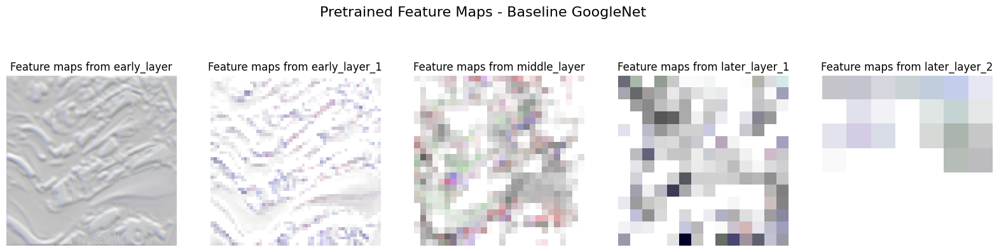

Epoch 1/3, Iteration 1, Train Loss: 0.6979
Epoch 2/3, Iteration 1, Train Loss: 0.0120
Epoch 3/3, Iteration 1, Train Loss: 0.0089
Training completed.
Final Training Accuracy: 0.9987



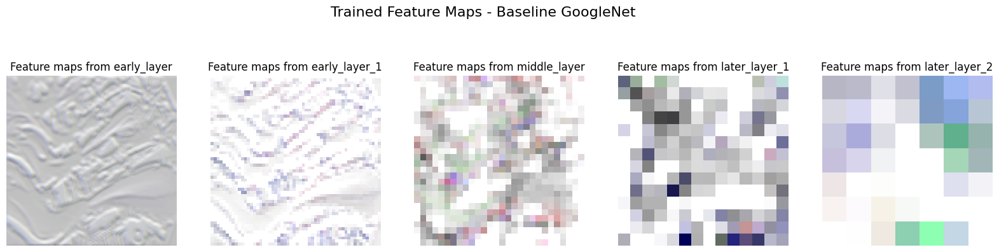

In [9]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
googlenet = googlenet_model_with_hooks()
googlenet = googlenet.to(device)

images, _ = next(iter(test_loader_googlenet))
images = images.to(device)

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Pretrained Feature Maps - Baseline GoogleNet')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.0001)
train_model(googlenet, train_loader_googlenet, criterion, optimizer, num_epochs=3)  # Replace train_loader with your DataLoader

feature_maps = {}

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Trained Feature Maps - Baseline GoogleNet')

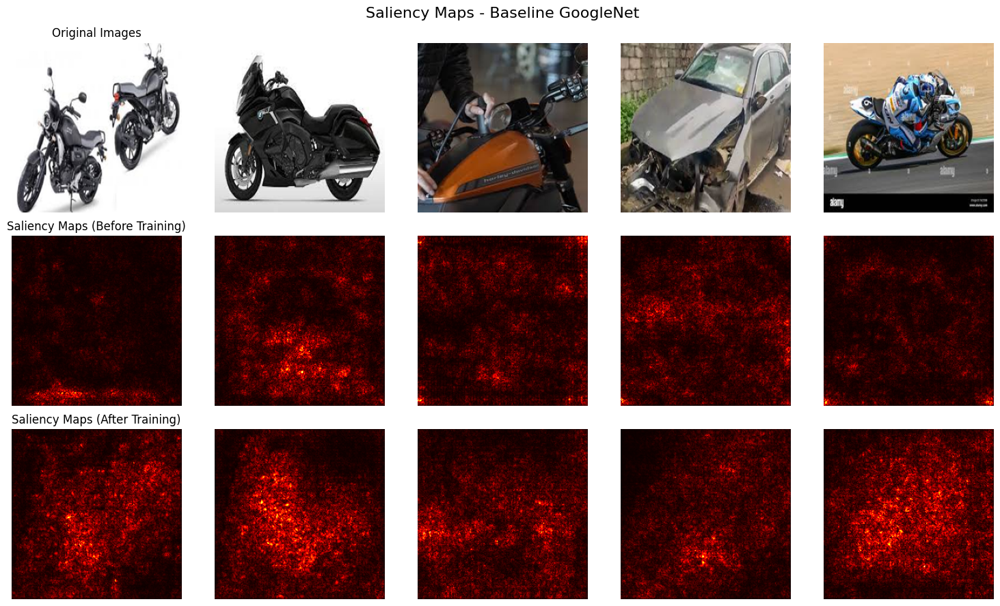

In [10]:
googlenet = googlenet_model()
images, saliency_before, saliency_after = compute_saliency_maps(googlenet, train_loader_googlenet, test_loader_googlenet, num_epochs=3)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - Baseline GoogleNet')

### **DenseNet**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 197MB/s]


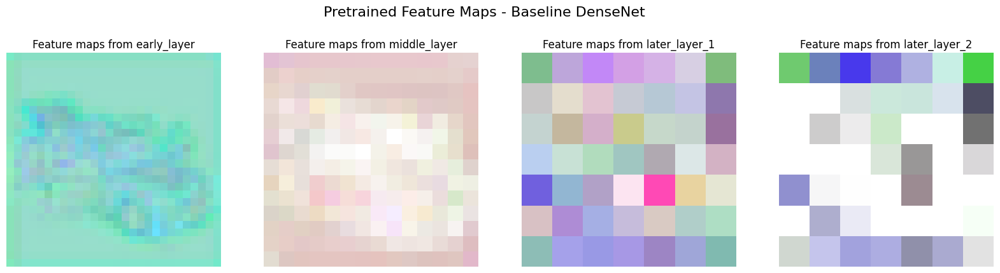

Epoch 1/3, Iteration 1, Train Loss: 0.7743
Epoch 1/3, Iteration 100, Train Loss: 0.0288
Epoch 2/3, Iteration 1, Train Loss: 0.0096
Epoch 2/3, Iteration 100, Train Loss: 0.0008
Epoch 3/3, Iteration 1, Train Loss: 0.0013
Epoch 3/3, Iteration 100, Train Loss: 0.0005
Training completed.
Final Training Accuracy: 0.9994



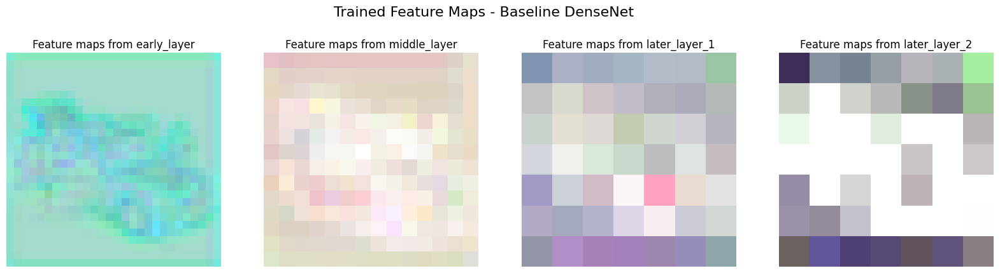

In [11]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
densenet = densenet_model_with_hooks()
densenet = densenet.to(device)

images, _ = next(iter(test_loader_densenet))
images = images.to(device)

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Pretrained Feature Maps - Baseline DenseNet')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(densenet.parameters(), lr=0.0001)
train_model(≈, train_loader_densenet, criterion, optimizer, num_epochs=3)  # Replace train_loader with your DataLoader

feature_maps = {}

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Trained Feature Maps - Baseline DenseNet')

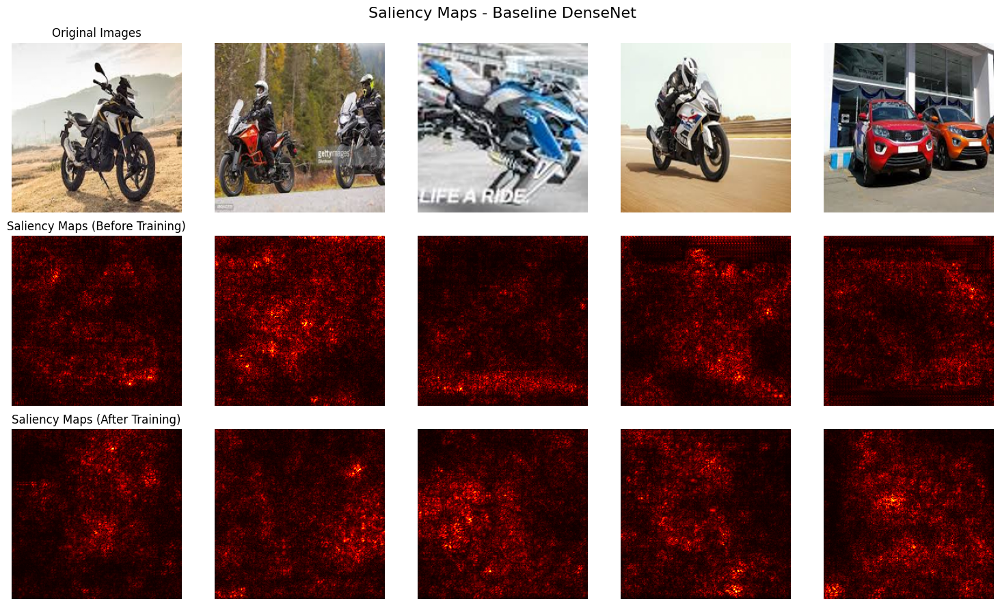

In [12]:
densenet = densenet121_model()
images, saliency_before, saliency_after = compute_saliency_maps(densenet, train_loader_densenet, test_loader_densenet, num_epochs=3)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - Baseline DenseNet')

## **2-Tile Permutations**

In [13]:
##2x2
images_np_permutation_2x2 = np.load('/content/drive/My Drive/Car-Bike-Dataset/2x2/images_np_permutation_2x2.npy')
X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_2x2, labels_np, test_size=0.2, random_state=42)
X_train_tensor_2x2 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
X_test_tensor_2x2 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
y_train_tensor_2x2 = torch.tensor(y_train, dtype=torch.long).cuda()
y_test_tensor_2x2 = torch.tensor(y_test, dtype=torch.long).cuda()
train_dataset_2x2 = TensorDataset(X_train_tensor_2x2, y_train_tensor_2x2)
test_dataset_2x2 = TensorDataset(X_test_tensor_2x2, y_test_tensor_2x2)

train_loader_2x2_googlenet = DataLoader(train_dataset_2x2, batch_size=32, shuffle=True)
test_loader_2x2_googlenet = DataLoader(test_dataset_2x2, batch_size=32, shuffle=True)

train_loader_2x2_densenet = DataLoader(train_dataset_2x2, batch_size=64, shuffle=True)
test_loader_2x2_densenet = DataLoader(test_dataset_2x2, batch_size=64, shuffle=True)

### **GoogleNet**

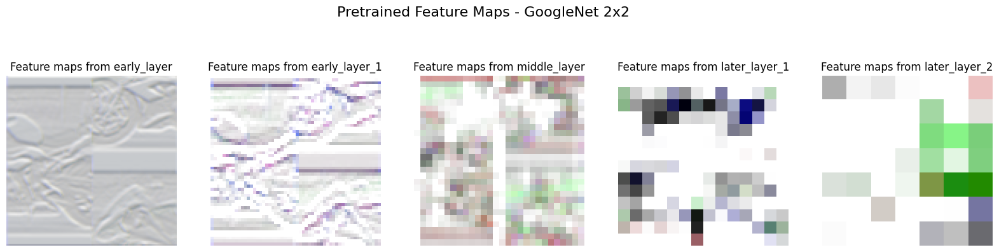

Epoch 1/3, Iteration 1, Train Loss: 0.6651
Epoch 1/3, Iteration 100, Train Loss: 0.0441
Epoch 2/3, Iteration 1, Train Loss: 0.0155
Epoch 2/3, Iteration 100, Train Loss: 0.0019
Epoch 3/3, Iteration 1, Train Loss: 0.0057
Epoch 3/3, Iteration 100, Train Loss: 0.0027
Training completed.
Final Training Accuracy: 0.9987



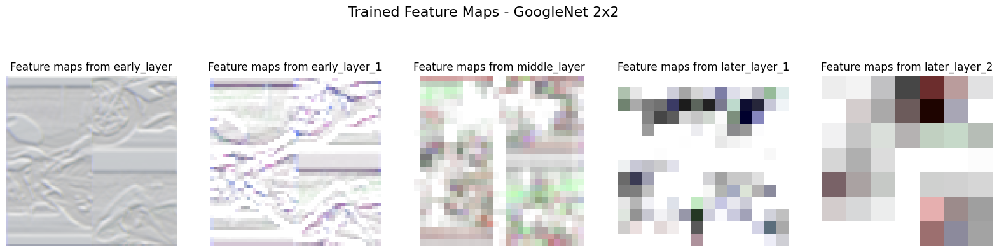

In [14]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
googlenet = googlenet_model_with_hooks()
googlenet = googlenet.to(device)

images, _ = next(iter(test_loader_2x2_googlenet))
images = images.to(device)

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Pretrained Feature Maps - GoogleNet 2x2')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.0001)
train_model(googlenet, train_loader_2x2_googlenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Trained Feature Maps - GoogleNet 2x2')

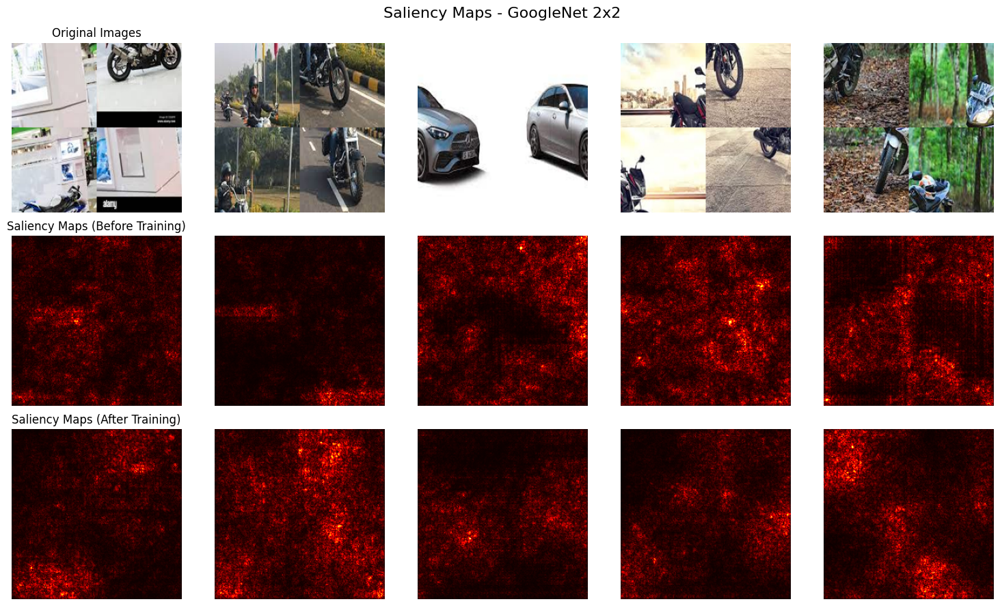

In [15]:
googlenet = googlenet_model()
images, saliency_before, saliency_after = compute_saliency_maps(googlenet, train_loader_2x2_googlenet, test_loader_2x2_googlenet, num_epochs=3)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - GoogleNet 2x2')

### **DenseNet**

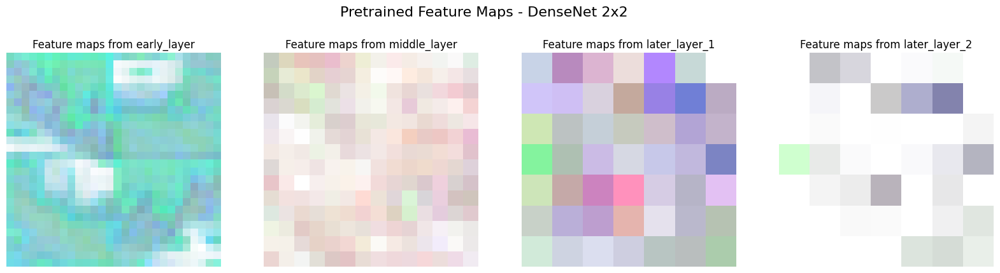

Epoch 1/3, Iteration 1, Train Loss: 0.6436
Epoch 2/3, Iteration 1, Train Loss: 0.0317
Epoch 3/3, Iteration 1, Train Loss: 0.0424
Training completed.
Final Training Accuracy: 0.9837



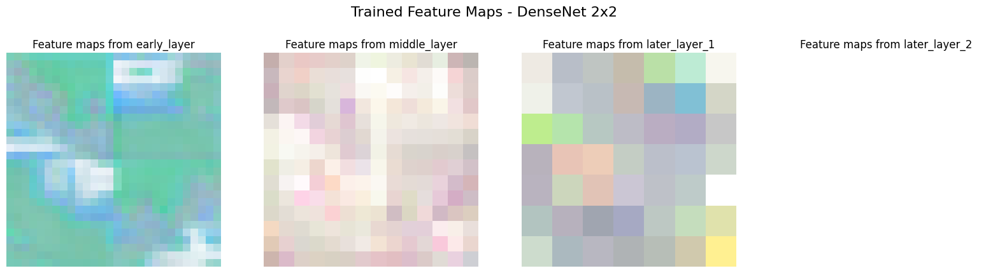

In [16]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
densenet = densenet_model_with_hooks()
densenet = densenet.to(device)

images, _ = next(iter(test_loader_2x2_densenet))
images = images.to(device)

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Pretrained Feature Maps - DenseNet 2x2')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(densenet.parameters(), lr=0.001)
train_model(densenet, train_loader_2x2_densenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Trained Feature Maps - DenseNet 2x2')



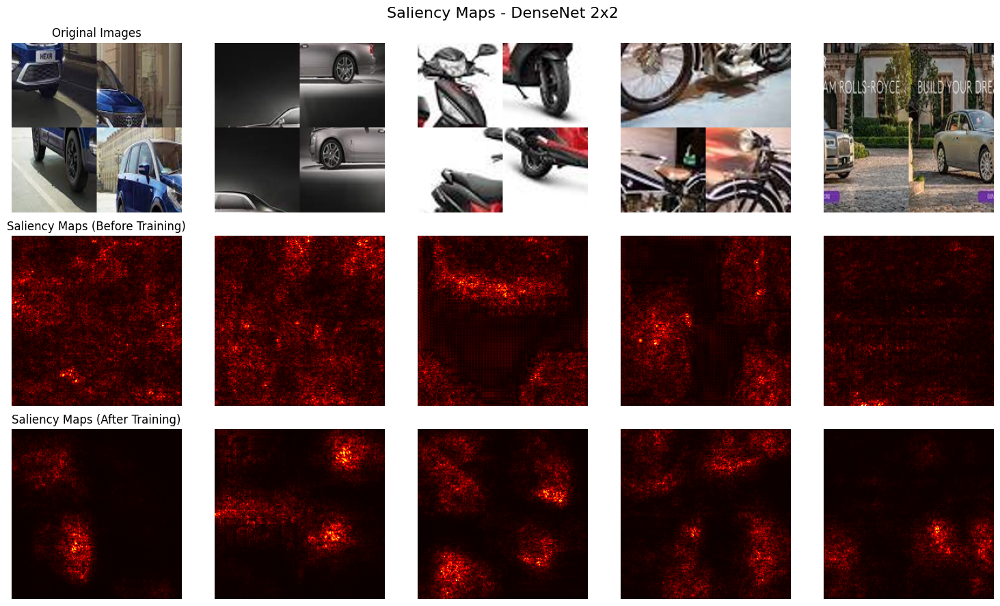

In [17]:
densenet = densenet121_model()
images, saliency_before, saliency_after = compute_saliency_maps(densenet, train_loader_2x2_densenet, test_loader_2x2_densenet, num_epochs=3,lr=0.001)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - DenseNet 2x2')

## **3-Tile Permutations**

In [18]:
##3x3
images_np_permutation_3x3 = np.load('/content/drive/My Drive/Car-Bike-Dataset/3x3/images_np_permutation_3x3.npy')
X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_3x3, labels_np, test_size=0.2, random_state=42)
X_train_tensor_3x3 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
X_test_tensor_3x3 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
y_train_tensor_3x3 = torch.tensor(y_train, dtype=torch.long).cuda()
y_test_tensor_3x3 = torch.tensor(y_test, dtype=torch.long).cuda()
train_dataset_3x3 = TensorDataset(X_train_tensor_3x3, y_train_tensor_3x3)
test_dataset_3x3 = TensorDataset(X_test_tensor_3x3, y_test_tensor_3x3)

train_loader_3x3_googlenet = DataLoader(train_dataset_3x3, batch_size=64, shuffle=True)
test_loader_3x3_googlenet = DataLoader(test_dataset_3x3, batch_size=64, shuffle=True)

train_loader_3x3_densenet = DataLoader(train_dataset_3x3, batch_size=32, shuffle=True)
test_loader_3x3_densenet = DataLoader(test_dataset_3x3, batch_size=32, shuffle=True)

### **GoogleNet**

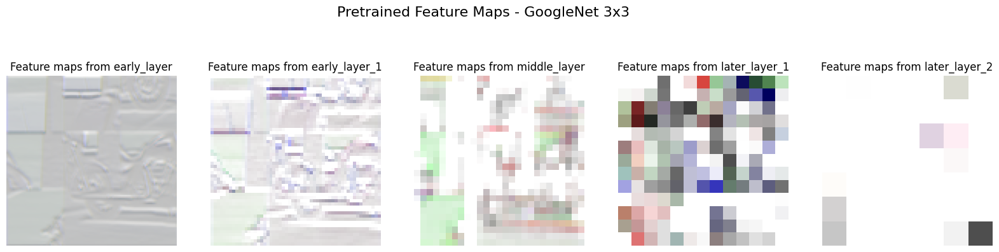

Epoch 1/3, Iteration 1, Train Loss: 0.8136
Epoch 2/3, Iteration 1, Train Loss: 0.0190
Epoch 3/3, Iteration 1, Train Loss: 0.0107
Training completed.
Final Training Accuracy: 0.9994



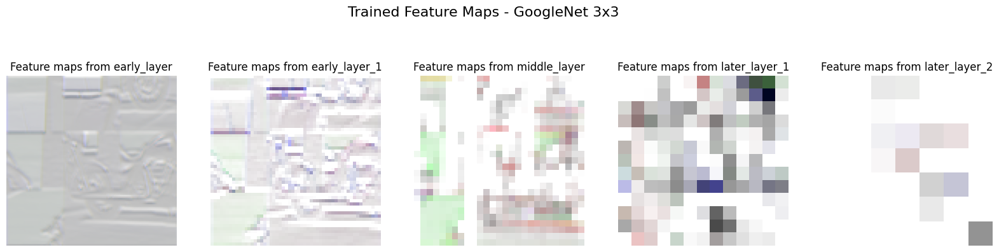

In [19]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
googlenet = googlenet_model_with_hooks()
googlenet = googlenet.to(device)

images, _ = next(iter(test_loader_3x3_googlenet))
images = images.to(device)

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Pretrained Feature Maps - GoogleNet 3x3')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.0001)
train_model(googlenet, train_loader_3x3_googlenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Trained Feature Maps - GoogleNet 3x3')

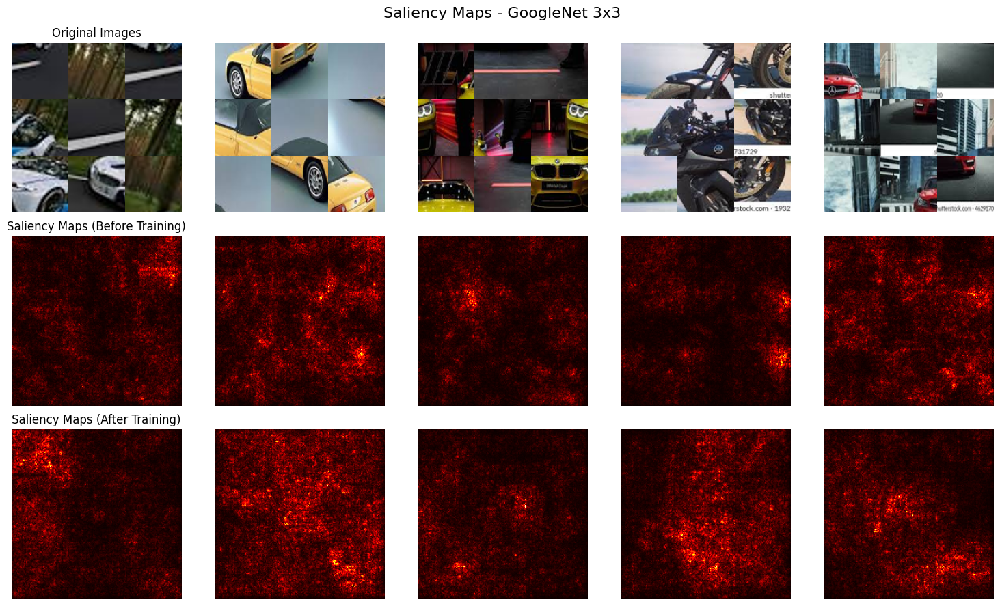

In [20]:
googlenet = googlenet_model()
images, saliency_before, saliency_after = compute_saliency_maps(googlenet, train_loader_3x3_googlenet, test_loader_3x3_googlenet, num_epochs=3)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - GoogleNet 3x3')

### **DenseNet**

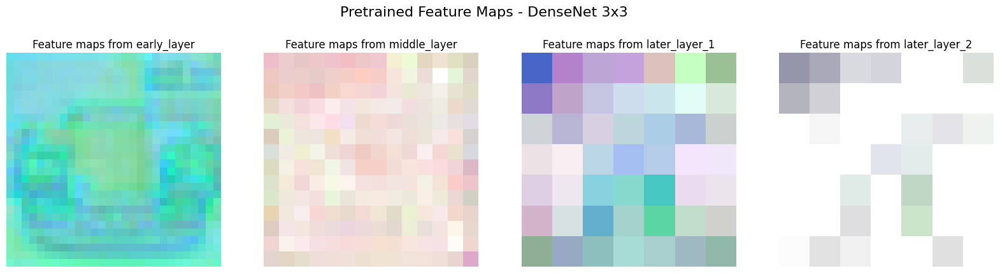

Epoch 1/3, Iteration 1, Train Loss: 0.7608
Epoch 1/3, Iteration 100, Train Loss: 0.0340
Epoch 2/3, Iteration 1, Train Loss: 0.0163
Epoch 2/3, Iteration 100, Train Loss: 0.0040
Epoch 3/3, Iteration 1, Train Loss: 0.0056
Epoch 3/3, Iteration 100, Train Loss: 0.0056
Training completed.
Final Training Accuracy: 0.9994



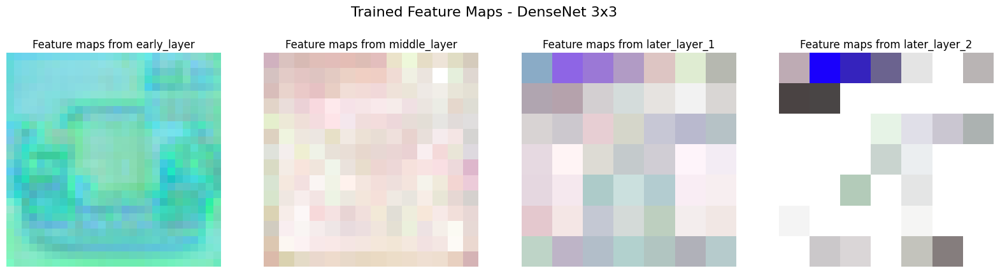

In [21]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
densenet = densenet_model_with_hooks()
densenet = densenet.to(device)

images, _ = next(iter(test_loader_3x3_densenet))
images = images.to(device)

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Pretrained Feature Maps - DenseNet 3x3')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(densenet.parameters(), lr=0.0001)
train_model(densenet, train_loader_3x3_densenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Trained Feature Maps - DenseNet 3x3')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


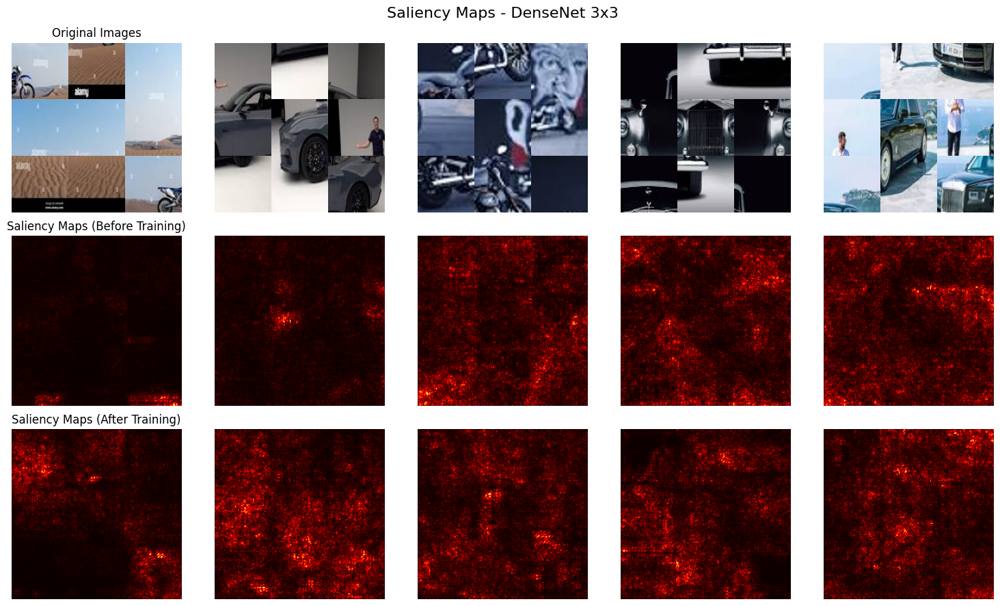

In [23]:
densenet = densenet121_model()
images, saliency_before, saliency_after = compute_saliency_maps(densenet, train_loader_3x3_densenet, test_loader_3x3_densenet, num_epochs=3,lr=0.0001)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - DenseNet 3x3')

## **4-Tile Permutations**

In [24]:
##4x4
images_np_permutation_4x4 = np.load('/content/drive/My Drive/Car-Bike-Dataset/4x4/images_np_permutation_4x4.npy')
X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np, test_size=0.2, random_state=42)
X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float).cuda()
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long).cuda()
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long).cuda()
train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4_googlenet = DataLoader(train_dataset_4x4, batch_size=64, shuffle=True)
test_loader_4x4_googlenet = DataLoader(test_dataset_4x4, batch_size=64, shuffle=True)

train_loader_4x4_densenet = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4_densenet = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

### **GoogleNet**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


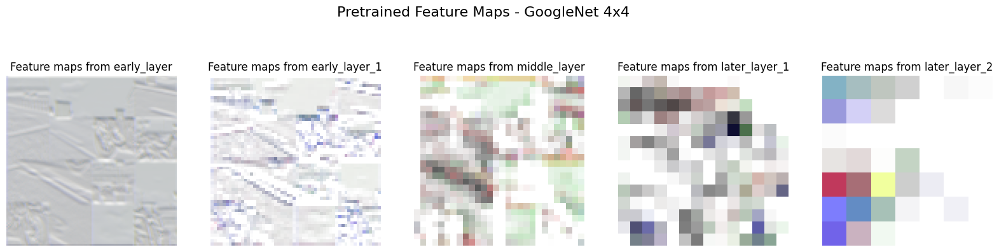

Epoch 1/3, Iteration 1, Train Loss: 0.7149
Epoch 2/3, Iteration 1, Train Loss: 0.0540
Epoch 3/3, Iteration 1, Train Loss: 0.0093
Training completed.
Final Training Accuracy: 0.9984



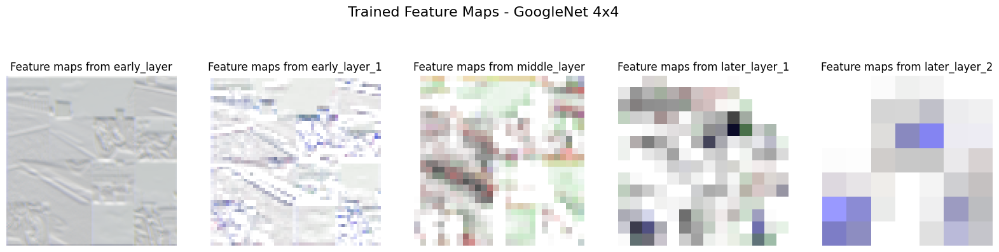

In [25]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
googlenet = googlenet_model_with_hooks()
googlenet = googlenet.to(device)

images, _ = next(iter(test_loader_4x4_googlenet))
images = images.to(device)

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Pretrained Feature Maps - GoogleNet 4x4')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.0001)
train_model(googlenet, train_loader_4x4_googlenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Trained Feature Maps - GoogleNet 4x4')

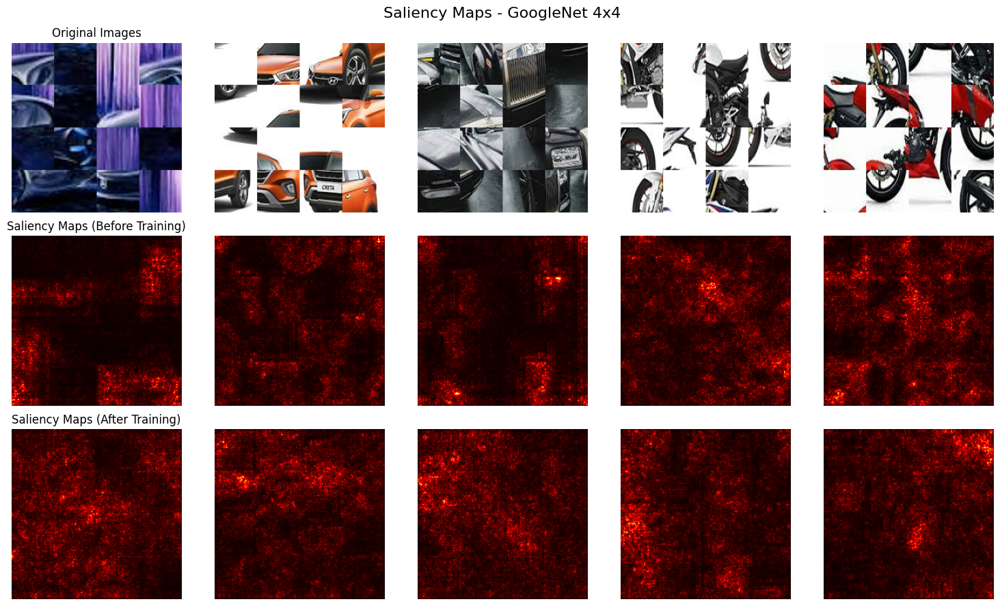

In [26]:
googlenet = googlenet_model()
images, saliency_before, saliency_after = compute_saliency_maps(googlenet, train_loader_4x4_googlenet, test_loader_4x4_googlenet, num_epochs=3)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - GoogleNet 4x4')

### **DenseNet**

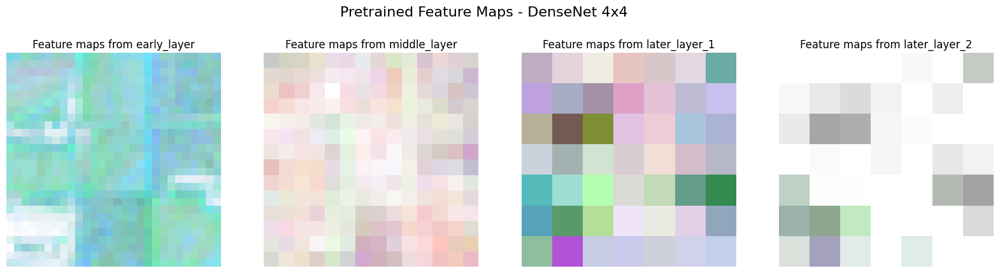

Epoch 1/3, Iteration 1, Train Loss: 0.7776
Epoch 1/3, Iteration 100, Train Loss: 0.0888
Epoch 2/3, Iteration 1, Train Loss: 0.0305
Epoch 2/3, Iteration 100, Train Loss: 0.1082
Epoch 3/3, Iteration 1, Train Loss: 0.0130
Epoch 3/3, Iteration 100, Train Loss: 0.0009
Training completed.
Final Training Accuracy: 0.9997



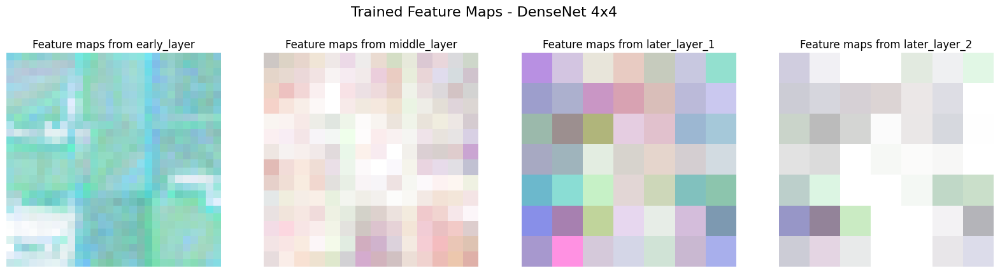

In [27]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
densenet = densenet_model_with_hooks()
densenet = densenet.to(device)

images, _ = next(iter(test_loader_3x3_densenet))
images = images.to(device)

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Pretrained Feature Maps - DenseNet 4x4')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(densenet.parameters(), lr=0.0001)
train_model(densenet, train_loader_4x4_densenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Trained Feature Maps - DenseNet 4x4')

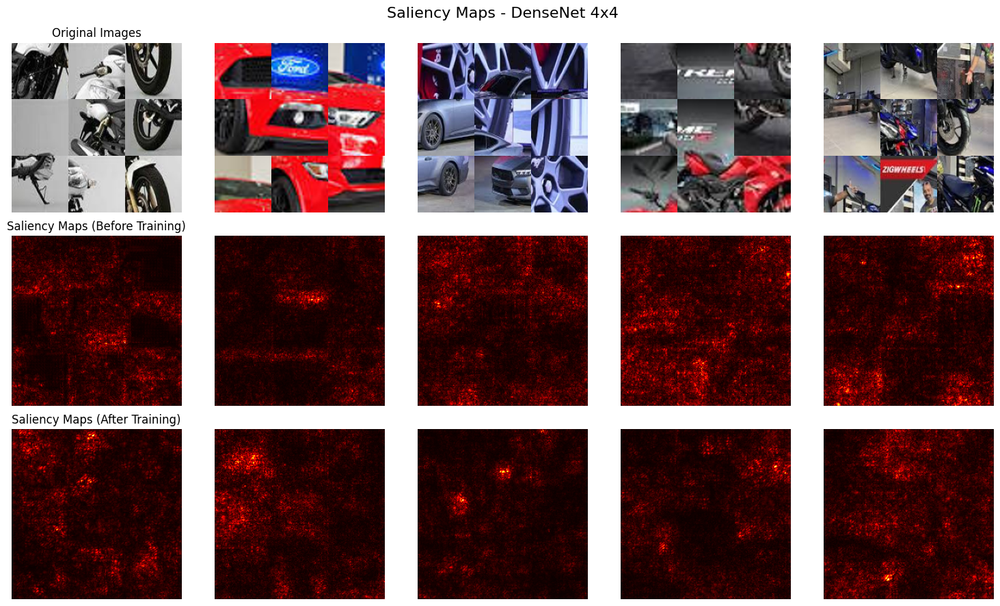

In [29]:
densenet = densenet121_model()
images, saliency_before, saliency_after = compute_saliency_maps(densenet, train_loader_4x4_densenet, test_loader_3x3_densenet, num_epochs=3,lr=0.0001)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - DenseNet 4x4')

## **20-Tile Permutations**

In [30]:
##20x20
images_np_permutation_20x20 = np.load('/content/drive/My Drive/Car-Bike-Dataset/20x20/images_np_permutation_20x20.npy')
X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_20x20, labels_np, test_size=0.2, random_state=42)
X_train_tensor_20x20 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_20x20 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_20x20 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_20x20 = torch.tensor(y_test, dtype=torch.long)
train_dataset_20x20 = TensorDataset(X_train_tensor_20x20, y_train_tensor_20x20)
test_dataset_20x20 = TensorDataset(X_test_tensor_20x20, y_test_tensor_20x20)

train_loader_20x20_googlenet = DataLoader(train_dataset_20x20, batch_size=64, shuffle=True)
test_loader_20x20_googlenet = DataLoader(test_dataset_20x20, batch_size=64, shuffle=True)

train_loader_20x20_densenet = DataLoader(train_dataset_20x20, batch_size=32, shuffle=True)
test_loader_20x20_densenet = DataLoader(test_dataset_20x20, batch_size=32, shuffle=True)

### **GoogleNet**

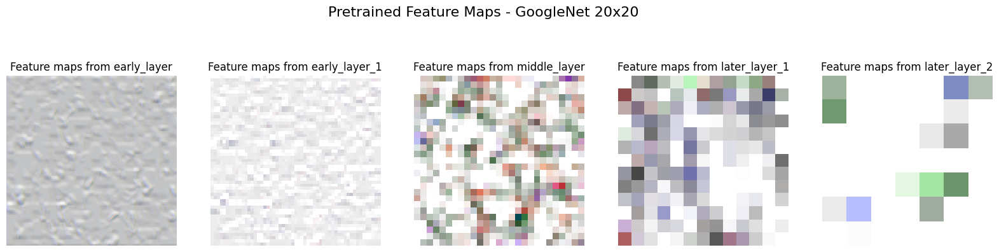

Epoch 1/3, Iteration 1, Train Loss: 0.7232
Epoch 2/3, Iteration 1, Train Loss: 0.2451
Epoch 3/3, Iteration 1, Train Loss: 0.0607
Training completed.
Final Training Accuracy: 0.9862



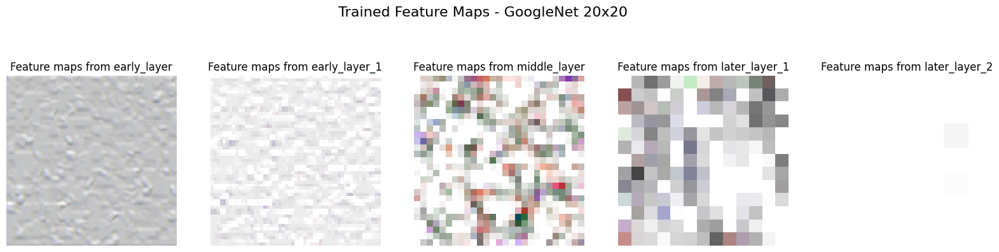

In [31]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
googlenet = googlenet_model_with_hooks()
googlenet = googlenet.to(device)

images, _ = next(iter(test_loader_20x20_googlenet))
images = images.to(device)

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Pretrained Feature Maps - GoogleNet 20x20')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.0001)
train_model(googlenet, train_loader_20x20_googlenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

googlenet(images)
visualize_feature_maps(layer_names_googlenet,main_title='Trained Feature Maps - GoogleNet 20x20')

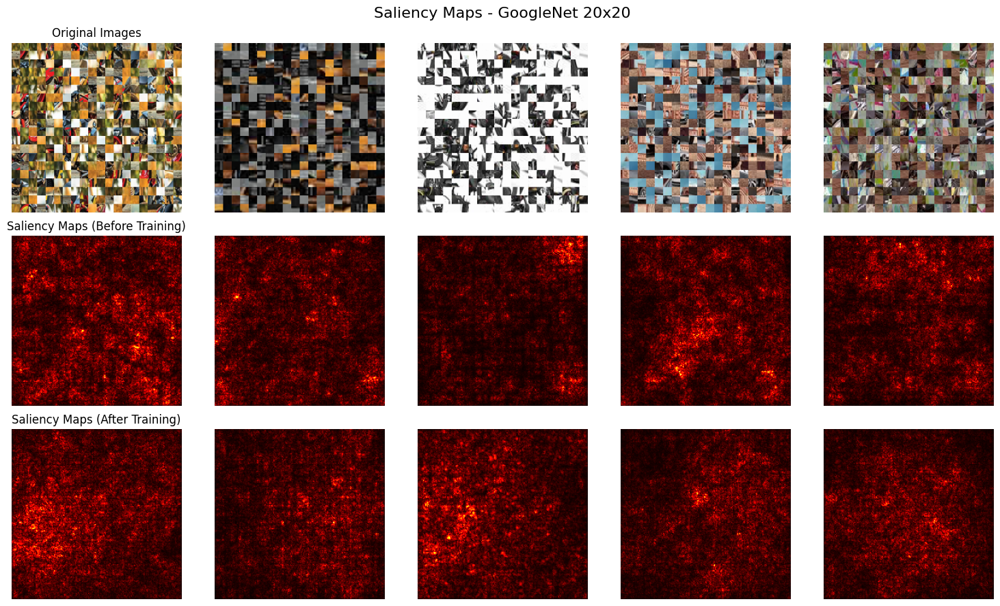

In [32]:
googlenet = googlenet_model()
images, saliency_before, saliency_after = compute_saliency_maps(googlenet, train_loader_20x20_googlenet, test_loader_20x20_googlenet, num_epochs=3)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - GoogleNet 20x20')

### **DenseNet**

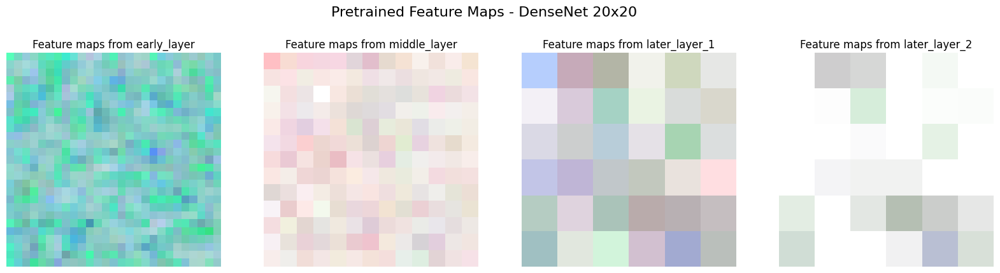

Epoch 1/3, Iteration 1, Train Loss: 0.7887
Epoch 1/3, Iteration 100, Train Loss: 0.3677
Epoch 2/3, Iteration 1, Train Loss: 0.1564
Epoch 2/3, Iteration 100, Train Loss: 0.5194
Epoch 3/3, Iteration 1, Train Loss: 0.2751
Epoch 3/3, Iteration 100, Train Loss: 0.4160
Training completed.
Final Training Accuracy: 0.8980



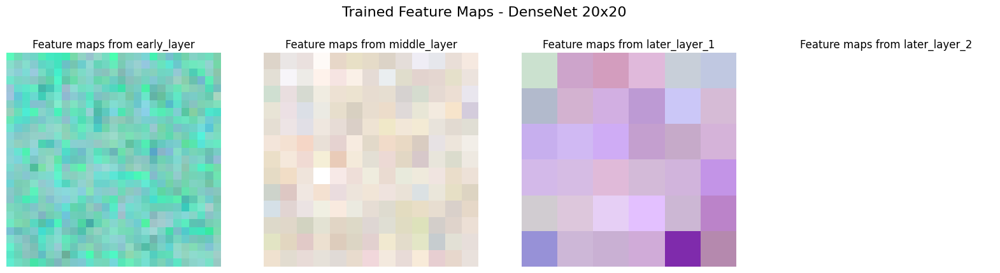

In [33]:
feature_maps = {}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
densenet = densenet_model_with_hooks()
densenet = densenet.to(device)

images, _ = next(iter(test_loader_20x20_densenet))
images = images.to(device)

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Pretrained Feature Maps - DenseNet 20x20')

criterion = nn.CrossEntropyLoss()
optimizer = Adam(densenet.parameters(), lr=0.001)
train_model(densenet, train_loader_20x20_densenet, criterion, optimizer, num_epochs=3)

feature_maps = {}

densenet(images)
visualize_feature_maps(layer_names_densenet,main_title='Trained Feature Maps - DenseNet 20x20')

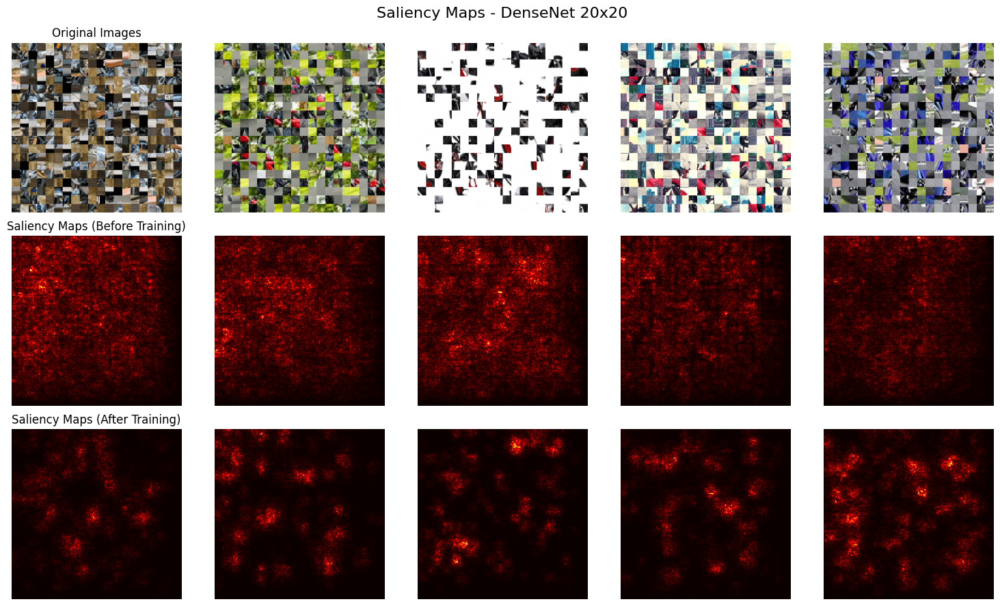

In [35]:
densenet = densenet121_model()
images, saliency_before, saliency_after = compute_saliency_maps(densenet, train_loader_20x20_densenet, test_loader_20x20_densenet, num_epochs=3,lr=0.001)

plot_saliency_maps(images, saliency_before, saliency_after,main_title='Saliency Maps - DenseNet 20x20')

# **Permutation Ranking**

In [41]:
##same function as the begining!
def split_image_into_tiles(img, num_tiles):
    tiles = []
    height, width, _ = img.shape
    tile_width = width // num_tiles
    tile_height = height // num_tiles

    for y in range(num_tiles):
        for x in range(num_tiles):
            tile = img[y * tile_height: (y + 1) * tile_height, x * tile_width: (x + 1) * tile_width]
            tiles.append(tile)

    return tiles

def permute_tiles_order(tiles, num_tiles):
    permutation = np.random.permutation(num_tiles**2)
    permuted_tiles = [tiles[i] for i in permutation]
    return permuted_tiles

def combine_permuted_tiles(tiles, num_tiles):
    tile_height, tile_width, _ = tiles[0].shape
    combined_width = tile_width * num_tiles
    combined_height = tile_height * num_tiles
    combined_image = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)

    for i, tile in enumerate(tiles):
        x = (i % num_tiles) * tile_width
        y = (i // num_tiles) * tile_height
        combined_image[y:y+tile_height, x:x+tile_width, :] = tile

    return combined_image

In [92]:
def permute_tiles_order_by_avg_range(img_display, num_tiles, avg_range):
    """
    Permutes the tiles of an image until the average distance of the permuted tiles falls within the specified range.

    Args:
        img_display (numpy.ndarray): The image to be permuted.
        num_tiles (int): The number of tiles in each dimension (assuming a square grid).
        avg_range (list): A list containing two elements specifying the desired range for the average distance.

    Returns:
        tuple: A tuple containing the average distance of the permuted tiles, the combined permuted image, and a count of iterations performed before convergence or breaking.

    """

    tiles = split_image_into_tiles(img_display, num_tiles)
    avg = -1
    max_iterations = 1000
    iterations = 0
    brake_count=0
    while not (avg >= avg_range[0] and avg < avg_range[1]):
        permutation = np.random.permutation(num_tiles**2)
        permuted_tiles = [tiles[i] for i in permutation]
        combined_image = combine_permuted_tiles(permuted_tiles, num_tiles)
        distance_sum = 0
        for i, tile in enumerate(permuted_tiles):
            distance = euclidean_distance(tile, tiles[i])
            distance_sum += distance
        avg = distance_sum / (num_tiles**2)
        iterations += 1
        if iterations >= max_iterations:
          if brake_count==1:
            brake_count+=1
            break
          brake_count+=1
          avg_range[0] = avg_range[0] - 500
          iterations = 0
    return avg, combined_image,brake_count

def manhattan_distance(image1, image2):
    """
    Calculates the Manhattan distance between two images.

    Args:
        image1 (numpy.ndarray): The first image.
        image2 (numpy.ndarray): The second image.

    Returns:
        float: The Manhattan distance between the two images.

    """
    return np.sum(np.abs(image1 - image2))


def euclidean_distance(image1, image2):
    """
    Calculates the Euclidean distance between two images.

    Args:
        image1 (numpy.ndarray): The first image.
        image2 (numpy.ndarray): The second image.

    Returns:
        float: The Euclidean distance between the two images.

    """
    return np.linalg.norm(image1 - image2)

def plot_original_and_permuted_image(original_img, permuted_img):
    """
    Plots the original and permuted images side by side.

    Args:
        original_img (numpy.ndarray): The original image.
        permuted_img (numpy.ndarray): The permuted image.

    """
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(permuted_img)
    plt.title('Permuted Image')
    plt.axis('off')
    plt.show()

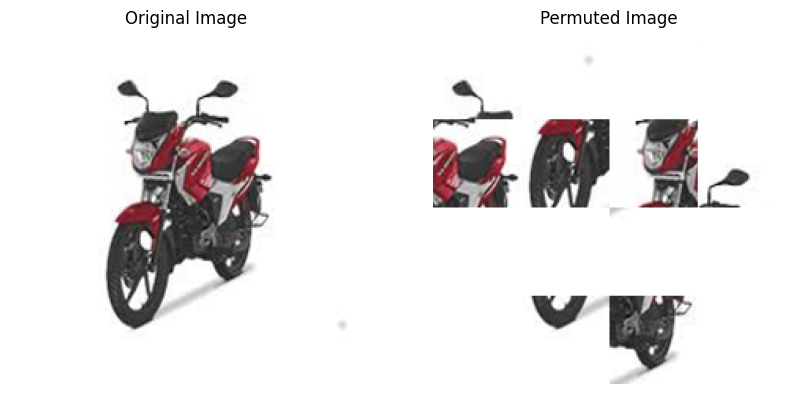

Distance for tile 1: 401126
Distance for tile 2: 210391
Distance for tile 3: 139671
Distance for tile 4: 0
Distance for tile 5: 977955
Distance for tile 6: 1119750
Distance for tile 7: 1122251
Distance for tile 8: 395363
Distance for tile 9: 0
Distance for tile 10: 1302540
Distance for tile 11: 920027
Distance for tile 12: 0
Distance for tile 13: 6
Distance for tile 14: 0
Distance for tile 15: 849189
Distance for tile 16: 2883
465072.0
7441152.0


In [75]:
img_display = images_np[22]

tiles = split_image_into_tiles(img_display, 4)

# Permute the order of tiles
permuted_tiles = permute_tiles_order(tiles, 4)

# Combine permuted tiles into a single image
combined_image = combine_permuted_tiles(permuted_tiles, 4)

plot_original_and_permuted_image(img_display, combined_image)

distance_sum=0
# Calculate and print Euclidean distance for each tile
for i, tile in enumerate(permuted_tiles):
    distance = manhattan_distance(tile, tiles[i])
    distance_sum+=distance
    print(f"Distance for tile {i + 1}: {distance}")
print(distance_sum/16)
print(distance_sum.sum())


images_np_permutation_4x4 = []
images_np_permutation_avg=[]
for image in images_np:
    tiles = split_image_into_tiles(image, 4)

    permuted_tiles = permute_tiles_order(tiles, 4)

    combined_image = combine_permuted_tiles(permuted_tiles, 4)

    images_np_permutation_4x4.append(combined_image)
    distance_sum=0
    for i, tile in enumerate(permuted_tiles):
        distance = manhattan_distance(tile, tiles[i])
        distance_sum+=distance

    images_np_permutation_avg.append(distance_sum/16)

images_np_permutation_4x4 = np.array(images_np_permutation_4x4)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np, test_size=0.2, random_state=42)

indices = np.arange(len(images_np_permutation_4x4))
train_indices, test_indices = train_test_split(indices, test_size=0.2, random_state=42)

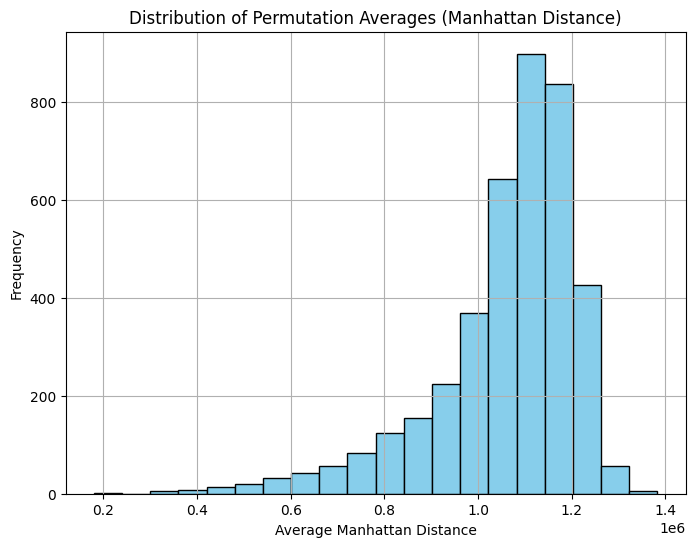

In [45]:
def plot_distribution(data, distance_type):
    """
    Plots the distribution of the permuted averages.

    Args:
        data (numpy.ndarray): The permuted averages.
        distance_type (str): The type of distance used.

    """
    plt.figure(figsize=(8, 6))
    plt.hist(data, bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Distribution of Permutation Averages ({distance_type} Distance)')
    plt.xlabel(f'Average {distance_type} Distance')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

plot_distribution(images_np_permutation_avg,'Manhattan')

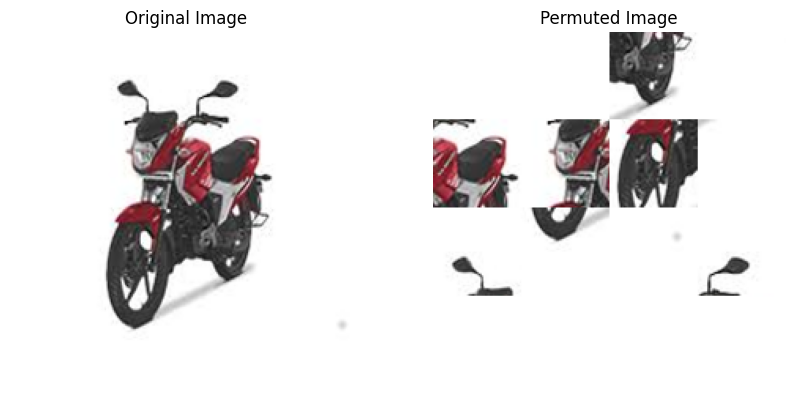

Distance for tile 1: 0.0
Distance for tile 2: 4858.956266524736
Distance for tile 3: 12062.081453878514
Distance for tile 4: 624.6198844097104
Distance for tile 5: 12993.703051863236
Distance for tile 6: 0.0
Distance for tile 7: 13482.74041135555
Distance for tile 8: 3772.2448223836163
Distance for tile 9: 9527.357660967704
Distance for tile 10: 15537.013902291521
Distance for tile 11: 13313.039209737197
Distance for tile 12: 9473.021112612385
Distance for tile 13: 2.449489742783178
Distance for tile 14: 7051.490268021364
Distance for tile 15: 445.5008417500465
Distance for tile 16: 266.3813056503778
6463.162480074297
103410.59968118875


In [79]:
img_display = images_np[22]

tiles = split_image_into_tiles(img_display, 4)

# Permute the order of tiles
permuted_tiles = permute_tiles_order(tiles, 4)

# Combine permuted tiles into a single image
combined_image = combine_permuted_tiles(permuted_tiles, 4)

plot_original_and_permuted_image(img_display, combined_image)

distance_sum=0
# Calculate and print Euclidean distance for each tile
for i, tile in enumerate(permuted_tiles):
    distance = euclidean_distance(tile, tiles[i])
    distance_sum+=distance
    print(f"Distance for tile {i + 1}: {distance}")
print(distance_sum/16)
print(distance_sum.sum())


images_np_permutation_4x4 = []
images_np_permutation_avg=[]
for image in images_np:
    tiles = split_image_into_tiles(image, 4)

    permuted_tiles = permute_tiles_order(tiles, 4)

    combined_image = combine_permuted_tiles(permuted_tiles, 4)

    images_np_permutation_4x4.append(combined_image)
    distance_sum=0
    for i, tile in enumerate(permuted_tiles):
        distance = manhattan_distance(tile, tiles[i])
        distance_sum+=distance

    images_np_permutation_avg.append(distance_sum/16)

images_np_permutation_4x4 = np.array(images_np_permutation_4x4)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np, test_size=0.2, random_state=42)

indices = np.arange(len(images_np_permutation_4x4))
train_indices, test_indices = train_test_split(indices, test_size=0.2, random_state=42)

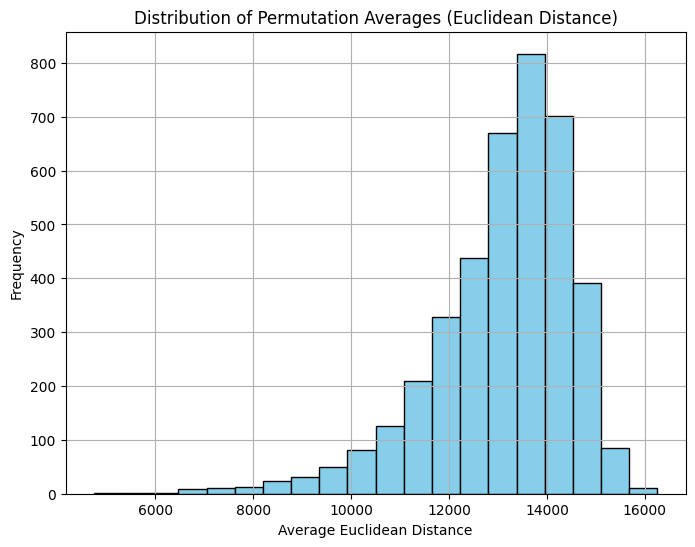

In [46]:
images_np_permutation_4x4 = []
images_np_permutation_avg=[]
for image in images_np:
    tiles = split_image_into_tiles(image, 4)

    permuted_tiles = permute_tiles_order(tiles, 4)

    combined_image = combine_permuted_tiles(permuted_tiles, 4)

    images_np_permutation_4x4.append(combined_image)
    distance_sum=0
    for i, tile in enumerate(permuted_tiles):
        distance = euclidean_distance(tile, tiles[i])
        distance_sum+=distance

    images_np_permutation_avg.append(distance_sum/16)

images_np_permutation_4x4 = np.array(images_np_permutation_4x4)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np, test_size=0.2, random_state=42)

plot_distribution(images_np_permutation_avg,'Euclidean')

In [71]:
print(len([avg for avg in images_np_permutation_avg if avg < 11000]),
len([avg for avg in images_np_permutation_avg if avg > 12000 and avg<14500]),
len([avg for avg in images_np_permutation_avg if avg>14500]))

permute_tiles_order_by_avg_range(images_np[22],4,[14500,20000])

323 2722 527


In [99]:
images_np_permutation_4x4_to11000 = []
images_np_permutation_avg_11000to145000 = []
images_np_permutation_avg_over14500 = []
labels_np_permutation_4x4_to11000 = []
labels_np_permutation_avg_11000to14500 = []
labels_np_permutation_avg_over14500 = []
avg_to11000 = []
avg_11000to14500 = []
avg_over14500 = []
for image, label in zip(images_np, labels_np):
    avg_to11000_num, combined_image, brake_count = permute_tiles_order_by_avg_range(image, 4, [0, 11000])
    if brake_count <= 1:
        images_np_permutation_4x4_to11000.append(combined_image)
        avg_to11000.append(avg_to11000_num)
        labels_np_permutation_4x4_to11000.append(label)

    avg_11000to14500_num, combined_image, brake_count = permute_tiles_order_by_avg_range(image, 4, [11000, 14500])
    if brake_count <= 1:
        images_np_permutation_avg_11000to14500.append(combined_image)
        avg_11000to14500.append(avg_11000to14500_num)
        labels_np_permutation_avg_11000to14500.append(label)

    avg_over14500_num, combined_image, brake_count = permute_tiles_order_by_avg_range(image, 4, [14500, 20000])
    if brake_count <= 1:
        images_np_permutation_avg_over14500.append(combined_image)
        avg_over14500.append(avg_over14500_num)
        labels_np_permutation_avg_over14500.append(label)


In [95]:
print(len(avg_to11000),len(avg_11000to14500),len(avg_over14500))

3996 3957 3536


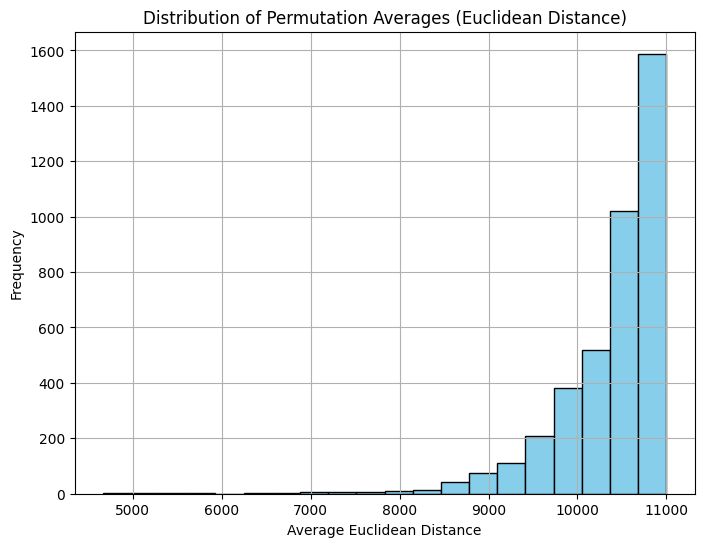

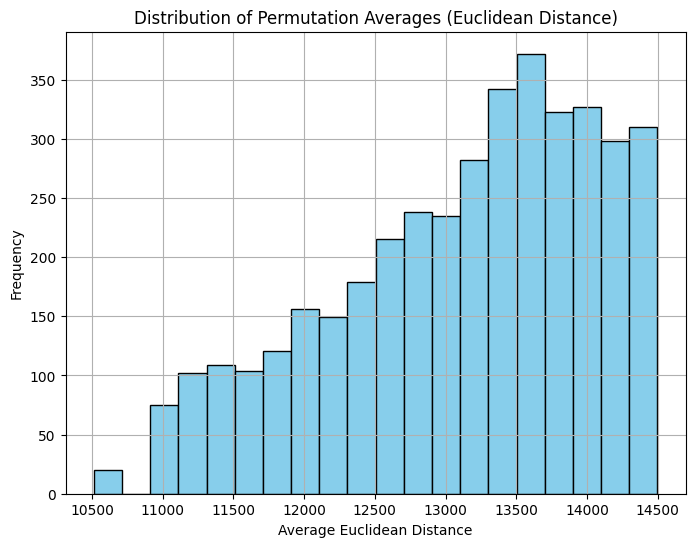

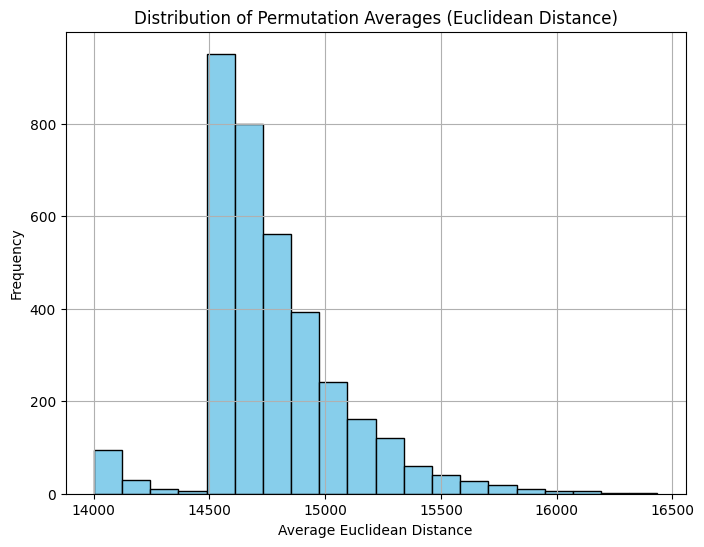

In [96]:
plot_distribution(avg_to11000,'Euclidean')
plot_distribution(avg_11000to14500,'Euclidean')
plot_distribution(avg_over14500,'Euclidean')

In [106]:
images_np_permutation_4x4 = np.array(images_np_permutation_4x4_to11000)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np_permutation_4x4_to11000, test_size=0.2, random_state=42)

X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long)

train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

googlenet = googlenet_model()
criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.001)
train_model(googlenet, train_loader_4x4, criterion, optimizer, num_epochs=3)

accuracy_googlenet_4x4_to11000, precision_googlenet_4x4_to11000, recall_googlenet_4x4_to11000, f1_googlenet_4x4_to11000, confusion_matrix_googlenet_4x4_to11000 = test_model(googlenet, test_loader_4x4)

Epoch 1/3, Iteration 1, Train Loss: 0.7378
Epoch 1/3, Iteration 100, Train Loss: 0.1031
Epoch 2/3, Iteration 1, Train Loss: 0.0893
Epoch 2/3, Iteration 100, Train Loss: 0.0057
Epoch 3/3, Iteration 1, Train Loss: 0.1870
Epoch 3/3, Iteration 100, Train Loss: 0.0653
Training completed.
Final Training Accuracy: 0.9765

Test Set Evaluation Metrics:
Accuracy: 0.96125
Precision: 0.994413407821229
Recall: 0.9246753246753247
F1 Score: 0.9582772543741588
Confusion Matrix:
[[413   2]
 [ 29 356]]


In [125]:
images_np_permutation_4x4 = np.array(images_np_permutation_avg_11000to14500)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np_permutation_avg_11000to14500, test_size=0.2, random_state=42)

X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long)

train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

googlenet = googlenet_model()
criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.001)
train_model(googlenet, train_loader_4x4, criterion, optimizer, num_epochs=3)

accuracy_googlenet_4x4_11000to14500, precision_googlenet_4x4_11000to14500, recall_googlenet_4x4_11000to14500, f1_googlenet_4x4_11000to14500, confusion_matrix_googlenet_4x4_11000to14500 = test_model(googlenet, test_loader_4x4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/3, Iteration 1, Train Loss: 0.6778
Epoch 2/3, Iteration 1, Train Loss: 0.0922
Epoch 3/3, Iteration 1, Train Loss: 0.0832
Training completed.
Final Training Accuracy: 0.9497

Test Set Evaluation Metrics:
Accuracy: 0.9506953223767383
Precision: 0.9344660194174758
Recall: 0.9697732997481109
F1 Score: 0.9517923362175525
Confusion Matrix:
[[367  27]
 [ 12 385]]


In [128]:
images_np_permutation_4x4 = np.array(images_np_permutation_avg_over14500)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np_permutation_avg_over14500, test_size=0.2, random_state=42)

X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long)

train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

googlenet = googlenet_model()
criterion = nn.CrossEntropyLoss()
optimizer = Adam(googlenet.parameters(), lr=0.001)
train_model(googlenet, train_loader_4x4, criterion, optimizer, num_epochs=3)

accuracy_googlenet_4x4_over14500, precision_googlenet_4x4_over14500, recall_googlenet_4x4_over14500, f1_googlenet_4x4_over14500, confusion_matrix_googlenet_4x4_over14500 = test_model(googlenet, test_loader_4x4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/3, Iteration 1, Train Loss: 0.7058
Epoch 2/3, Iteration 1, Train Loss: 0.0611
Epoch 3/3, Iteration 1, Train Loss: 0.0548
Training completed.
Final Training Accuracy: 0.9527

Test Set Evaluation Metrics:
Accuracy: 0.940677966101695
Precision: 0.9046321525885559
Recall: 0.9793510324483776
F1 Score: 0.9405099150141643
Confusion Matrix:
[[334  35]
 [  7 332]]


F1 Score for Low (0-11,000): 0.96
F1 Score for Mid (11,000-14,500): 0.95
F1 Score for High (over 14,500): 0.94
Accuracy for Low (0-11,000): 0.96
Accuracy for Mid (11,000-14,500): 0.95
Accuracy for High (over 14,500): 0.94
Recall for Low (0-11,000): 0.92
Recall for Mid (11,000-14,500): 0.97
Recall for High (over 14,500): 0.98
Precision for Low (0-11,000): 0.99
Precision for Mid (11,000-14,500): 0.93
Precision for High (over 14,500): 0.9


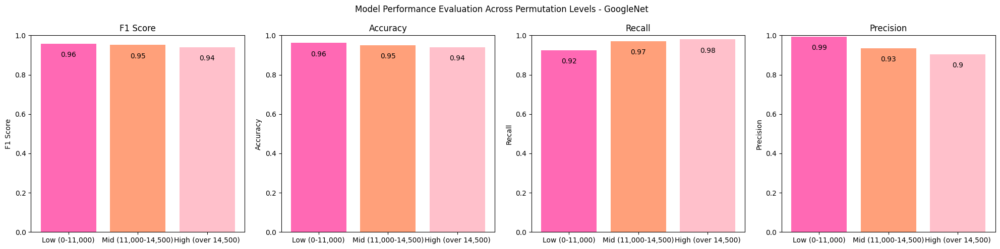

In [144]:
f1_scores=[f1_googlenet_4x4_to11000,f1_googlenet_4x4_11000to14500,f1_googlenet_4x4_over14500]
accuracy_scores=[accuracy_googlenet_4x4_to11000,accuracy_googlenet_4x4_11000to14500,accuracy_googlenet_4x4_over14500]
recall_scores=[recall_googlenet_4x4_to11000,recall_googlenet_4x4_11000to14500,recall_googlenet_4x4_over14500]
precision_scores=[precision_googlenet_4x4_to11000,precision_googlenet_4x4_11000to14500,precision_googlenet_4x4_over14500]
AVG_level = ['Low (0-11,000)', 'Mid (11,000-14,500)', 'High (over 14,500)']
plot_evaluation_metrics(AVG_level, f1_scores, accuracy_scores, recall_scores, precision_scores, 'Model Performance Evaluation Across Permutation Levels - GoogleNet')

In [136]:
images_np_permutation_4x4 = np.array(images_np_permutation_4x4_to11000)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np_permutation_4x4_to11000, test_size=0.2, random_state=42)

X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long)

train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

resnet18 = resnet18_model()
criterion = nn.CrossEntropyLoss()
optimizer = Adam(resnet18.parameters(), lr=0.001)
train_model(resnet18, train_loader_4x4, criterion, optimizer, num_epochs=3)

accuracy_resnet18_model_4x4_to11000, precision_resnet18_model_4x4_to11000, recall_resnet18_model_4x4_to11000, f1_resnet18_model_4x4_to11000, confusion_matrix_resnet18_model_4x4_to11000 = test_model(resnet18, test_loader_4x4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/3, Iteration 1, Train Loss: 0.7091
Epoch 1/3, Iteration 100, Train Loss: 0.0863
Epoch 2/3, Iteration 1, Train Loss: 0.0520
Epoch 2/3, Iteration 100, Train Loss: 0.0470
Epoch 3/3, Iteration 1, Train Loss: 0.0221
Epoch 3/3, Iteration 100, Train Loss: 0.0763
Training completed.
Final Training Accuracy: 0.9656

Test Set Evaluation Metrics:
Accuracy: 0.95875
Precision: 0.9292682926829269
Recall: 0.9896103896103896
F1 Score: 0.958490566037736
Confusion Matrix:
[[386  29]
 [  4 381]]


In [137]:
images_np_permutation_4x4 = np.array(images_np_permutation_avg_11000to14500)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np_permutation_avg_11000to14500, test_size=0.2, random_state=42)

X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long)

train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

resnet18 = resnet18_model()
criterion = nn.CrossEntropyLoss()
optimizer = Adam(resnet18.parameters(), lr=0.001)
train_model(resnet18, train_loader_4x4, criterion, optimizer, num_epochs=3)

accuracy_resnet18_model_4x4_11000to14500, precision_resnet18_model_4x4_11000to14500, recall_resnet18_model_4x4_11000to14500, f1_resnet18_model_4x4_11000to14500, confusion_matrix_resnet18_model_4x4_11000to14500 = test_model(resnet18, test_loader_4x4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/3, Iteration 1, Train Loss: 0.7049
Epoch 2/3, Iteration 1, Train Loss: 0.0889
Epoch 3/3, Iteration 1, Train Loss: 0.0895
Training completed.
Final Training Accuracy: 0.9712

Test Set Evaluation Metrics:
Accuracy: 0.9620733249051833
Precision: 0.9919571045576407
Recall: 0.9319899244332494
F1 Score: 0.961038961038961
Confusion Matrix:
[[391   3]
 [ 27 370]]


In [138]:
images_np_permutation_4x4 = np.array(images_np_permutation_avg_over14500)

X_train, X_test, y_train, y_test = train_test_split(images_np_permutation_4x4, labels_np_permutation_avg_over14500, test_size=0.2, random_state=42)

X_train_tensor_4x4 = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float)
X_test_tensor_4x4 = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float)
y_train_tensor_4x4 = torch.tensor(y_train, dtype=torch.long)
y_test_tensor_4x4 = torch.tensor(y_test, dtype=torch.long)

train_dataset_4x4 = TensorDataset(X_train_tensor_4x4, y_train_tensor_4x4)
test_dataset_4x4 = TensorDataset(X_test_tensor_4x4, y_test_tensor_4x4)

train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=32, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=32, shuffle=True)

resnet18 = resnet18_model()
criterion = nn.CrossEntropyLoss()
optimizer = Adam(resnet18.parameters(), lr=0.001)
train_model(resnet18, train_loader_4x4, criterion, optimizer, num_epochs=3)

accuracy_resnet18_model_4x4_over14500, precision_resnet18_model_4x4_over14500, recall_resnet18_model_4x4_over14500, f1_resnet18_model_4x4_over14500, confusion_matrix_resnet18_model_4x4_over14500 = test_model(resnet18, test_loader_4x4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/3, Iteration 1, Train Loss: 0.7860
Epoch 2/3, Iteration 1, Train Loss: 0.2094
Epoch 3/3, Iteration 1, Train Loss: 0.1159
Training completed.
Final Training Accuracy: 0.9626

Test Set Evaluation Metrics:
Accuracy: 0.8912429378531074
Precision: 0.8149038461538461
Recall: 1.0
F1 Score: 0.8980132450331125
Confusion Matrix:
[[292  77]
 [  0 339]]


F1 Score for Low (0-11,000): 0.96
F1 Score for Mid (11,000-14,500): 0.96
F1 Score for High (over 14,500): 0.9
Accuracy for Low (0-11,000): 0.96
Accuracy for Mid (11,000-14,500): 0.96
Accuracy for High (over 14,500): 0.89
Recall for Low (0-11,000): 0.99
Recall for Mid (11,000-14,500): 0.93
Recall for High (over 14,500): 1.0
Precision for Low (0-11,000): 0.93
Precision for Mid (11,000-14,500): 0.99
Precision for High (over 14,500): 0.81


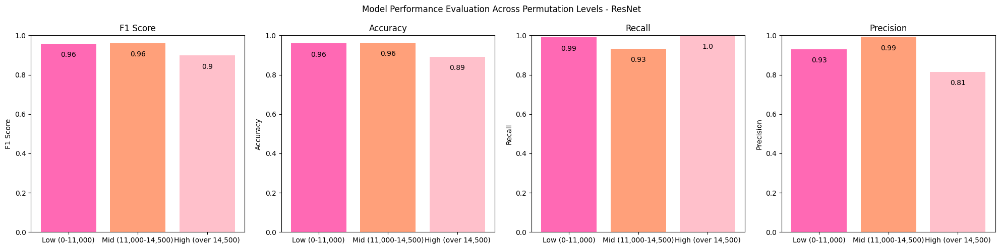

In [142]:
f1_scores=[f1_resnet18_model_4x4_to11000,f1_resnet18_model_4x4_11000to14500,f1_resnet18_model_4x4_over14500]
accuracy_scores=[accuracy_resnet18_model_4x4_to11000,accuracy_resnet18_model_4x4_11000to14500,accuracy_resnet18_model_4x4_over14500]
recall_scores=[recall_resnet18_model_4x4_to11000,recall_resnet18_model_4x4_11000to14500,recall_resnet18_model_4x4_over14500]
precision_scores=[precision_resnet18_model_4x4_to11000,precision_resnet18_model_4x4_11000to14500,precision_resnet18_model_4x4_over14500]
AVG_level = ['Low (0-11,000)', 'Mid (11,000-14,500)', 'High (over 14,500)']
plot_evaluation_metrics(AVG_level, f1_scores, accuracy_scores, recall_scores, precision_scores, 'Model Performance Evaluation Across Permutation Levels - ResNet')


# **Dreamed big, had low computational power, but we made it work! Thanks for the adventure!** 🚀🧠💻


